# fig1_new_region - Part 4/8\n\n自动拆分版本（按步骤执行）。\n包含统一 bootstrap 和共享模块导入。\n

In [ ]:
# AUTO_BOOTSTRAP_V2
from pathlib import Path
import sys
import os
import builtins
import numpy as np
import pandas as pd

ROOT = Path.cwd()
if not (ROOT / "projects").exists():
    cur = Path.cwd().resolve()
    for p in [cur] + list(cur.parents):
        if (p / "projects").exists():
            ROOT = p
            break

NB_PATH = Path.cwd()
if "clone_motif" in str(NB_PATH):
    PROJECT_DIR = ROOT / "projects" / "clone_motif"
else:
    PROJECT_DIR = ROOT / "projects" / "our_multiregion_motif"

DATA_RAW = PROJECT_DIR / "data" / "raw"
DATA_PROCESSED = PROJECT_DIR / "data" / "processed"
OUT_FIG = PROJECT_DIR / "outputs" / "figures"
OUT_TABLE = PROJECT_DIR / "outputs" / "tables"
OUT_ARCH = PROJECT_DIR / "outputs" / "archives"

for d in [DATA_PROCESSED, OUT_FIG, OUT_TABLE, OUT_ARCH]:
    d.mkdir(parents=True, exist_ok=True)

SHARED_SRC = ROOT / "projects" / "shared" / "src"
if str(SHARED_SRC) not in sys.path:
    sys.path.append(str(SHARED_SRC))

from motif_common import combination, indices_for_region, union_indices_for_regions, p_to_star, format_p_decimal_3sig, sort_by_order, truncate_colormap

READ_EXT = {".csv", ".json", ".npy", ".pkl", ".xlsx"}
FIG_EXT = {".svg", ".png", ".pdf"}
TABLE_EXT = {".csv", ".xlsx"}


def _as_path(x):
    return Path(x) if isinstance(x, (str, os.PathLike)) else x


def resolve_read_path(path):
    p = _as_path(path)
    if not isinstance(p, Path):
        return path
    if p.is_absolute() or p.exists():
        return str(p)
    if p.suffix.lower() in READ_EXT:
        for c in [DATA_RAW / p.name, ROOT / p.name]:
            if c.exists():
                return str(c)
    return str(p)


def resolve_write_path(path):
    p = _as_path(path)
    if not isinstance(p, Path):
        return path
    if p.is_absolute():
        p.parent.mkdir(parents=True, exist_ok=True)
        return str(p)
    ext = p.suffix.lower()
    if ext in FIG_EXT:
        out = OUT_FIG / p.name
    elif ext in TABLE_EXT:
        out = OUT_TABLE / p.name
    elif ext == ".zip":
        out = OUT_ARCH / p.name
    elif ext == ".npy":
        out = DATA_PROCESSED / p.name
    else:
        out = PROJECT_DIR / p
    out.parent.mkdir(parents=True, exist_ok=True)
    return str(out)

if not hasattr(builtins, "_orig_open_codex"):
    builtins._orig_open_codex = builtins.open


def _open_patch(file, mode="r", *args, **kwargs):
    if isinstance(file, (str, os.PathLike)):
        if any(m in mode for m in ["r", "a"]):
            file = resolve_read_path(file)
        if any(m in mode for m in ["w", "a", "x"]):
            file = resolve_write_path(file)
    return builtins._orig_open_codex(file, mode, *args, **kwargs)


builtins.open = _open_patch

if not hasattr(np, "_orig_load_codex"):
    np._orig_load_codex = np.load
np.load = lambda file, *a, **k: np._orig_load_codex(resolve_read_path(file), *a, **k)

if not hasattr(np, "_orig_save_codex"):
    np._orig_save_codex = np.save
np.save = lambda file, arr, *a, **k: np._orig_save_codex(resolve_write_path(file), arr, *a, **k)

if not hasattr(pd, "_orig_read_csv_codex"):
    pd._orig_read_csv_codex = pd.read_csv
pd.read_csv = lambda f, *a, **k: pd._orig_read_csv_codex(resolve_read_path(f) if isinstance(f, (str, os.PathLike)) else f, *a, **k)

if not hasattr(pd, "_orig_read_excel_codex"):
    pd._orig_read_excel_codex = pd.read_excel
pd.read_excel = lambda f, *a, **k: pd._orig_read_excel_codex(resolve_read_path(f) if isinstance(f, (str, os.PathLike)) else f, *a, **k)

if not hasattr(pd.DataFrame, "_orig_to_csv_codex"):
    pd.DataFrame._orig_to_csv_codex = pd.DataFrame.to_csv


def _to_csv_patch(self, path_or_buf=None, *args, **kwargs):
    if isinstance(path_or_buf, (str, os.PathLike)):
        path_or_buf = resolve_write_path(path_or_buf)
    return pd.DataFrame._orig_to_csv_codex(self, path_or_buf, *args, **kwargs)


pd.DataFrame.to_csv = _to_csv_patch

if not hasattr(pd.DataFrame, "_orig_to_excel_codex"):
    pd.DataFrame._orig_to_excel_codex = pd.DataFrame.to_excel


def _to_excel_patch(self, excel_writer, *args, **kwargs):
    if isinstance(excel_writer, (str, os.PathLike)):
        excel_writer = resolve_write_path(excel_writer)
    return pd.DataFrame._orig_to_excel_codex(self, excel_writer, *args, **kwargs)


pd.DataFrame.to_excel = _to_excel_patch

try:
    import matplotlib.pyplot as plt
    if not hasattr(plt, "_orig_savefig_codex"):
        plt._orig_savefig_codex = plt.savefig
    plt.savefig = lambda f, *a, **k: plt._orig_savefig_codex(resolve_write_path(f) if isinstance(f, (str, os.PathLike)) else f, *a, **k)
except Exception:
    pass

print(f"[bootstrap] project={PROJECT_DIR.name} data={DATA_RAW}")


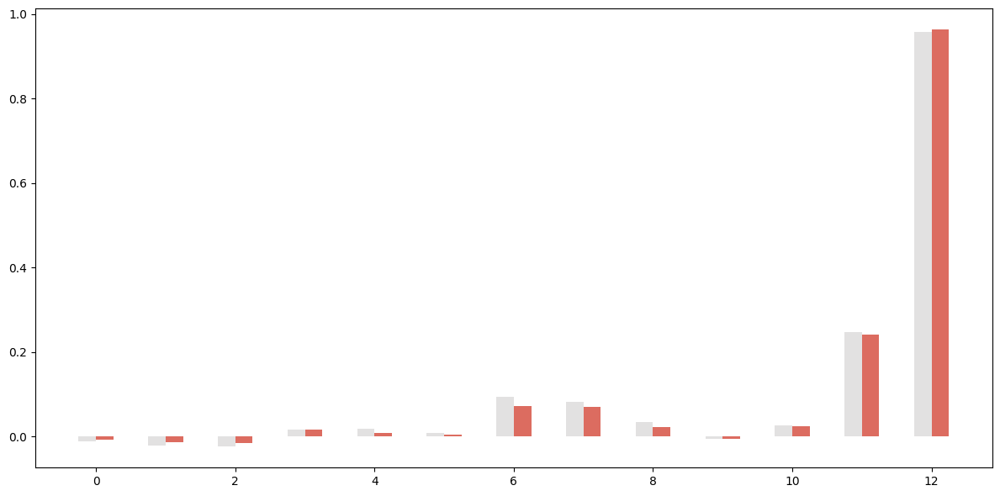

In [32]:
import numpy as np
import matplotlib.pyplot as plt

# 你已有：
# nz
# nz_clone

# ---- 保险检查 + 拉平成 1D ----
nz = np.asarray(nz, float).ravel()
nz_clone = np.asarray(nz_clone, float).ravel()
if nz.shape[0] == 14: nz = nz[1:]
if nz_clone.shape[0] == 14: nz_clone = nz_clone[1:]
assert nz.shape[0] == 13 and nz_clone.shape[0] == 13, (nz.shape, nz_clone.shape)

# ---- 画图：clone 在前，ION 在后 ----
x = np.arange(13)
bar_width = 0.25
colors = plt.cm.coolwarm(np.linspace(0.5, 0.9, 2))
c1, c2 = colors[0], colors[-1]   # 天蓝 / 玫粉

plt.figure(figsize=(12, 6))
plt.bar(x - bar_width/2, nz_clone, width=bar_width, label="MOp clone",    color=c1, alpha=0.85)
plt.bar(x + bar_width/2, nz,       width=bar_width, label="MOp from ION", color=c2, alpha=0.85)


plt.tight_layout()

# plt.savefig("MOp_NZ_clone_vs_ION.svg", format="svg", bbox_inches="tight")
plt.show()

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import math
import pickle

# =========================
# 1) 从 ION(pkl) 里取 motif 计数 & n
# =========================
d = pickle.load(open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb"))

# 你这里用的是 d["results"][5]["MOp"]["motif_results"]["0"]
ion_blk = d["results"][5]["MOp"]
ion_mr  = ion_blk["motif_results"]["0"]

def _pick_first(dic, keys):
    for k in keys:
        if k in dic:
            return dic[k]
    return None

# ---- ION 的 motif 计数（优先找 real；找不到就报错）----
ion_real = _pick_first(ion_mr, ["real", "Real", "obs", "count", "counts"])
if ion_real is None:
    raise KeyError(f"在 pkl 里没找到 ION 的 motif 计数列（尝试 real/obs/count）。ion_mr keys={list(ion_mr.keys())}")

ion_real = np.asarray(ion_real, float).ravel()
if ion_real.shape[0] == 14:  # 兼容老版本 q[0] 占位
    ion_real = ion_real[1:]
if ion_real.shape[0] != 13:
    raise ValueError(f"ION motif 计数维度不是 13：{ion_real.shape}")

# ---- ION 的 n（优先在 ion_blk 里找；找不到再想办法）----
ion_n = _pick_first(ion_blk, ["n", "N", "numOfNeuron", "num_neuron", "n_nodes"])
if ion_n is None:
    # 兜底：如果 pkl 里没存 n，你只能自己补（比如从当时的 MOp 节点列表长度推回）
    raise KeyError(f"在 pkl 里没找到 ION 的 n（尝试 n/N/numOfNeuron...）。ion_blk keys={list(ion_blk.keys())}")

ion_n = int(ion_n)
if ion_n < 3:
    raise ValueError(f"ION n < 3：n={ion_n}")

# =========================
# 2) Clone：从你刚算出来的 res 里取 motif 计数 & n
# =========================
# 你前面已经有：
# res = analyze_motif_for_submatrix(...)
# res["table"] 含 real / ER mean / ... / NZ_ER
clone_real = np.asarray(res["table"]["real"].values, float).ravel()
if clone_real.shape[0] == 14:
    clone_real = clone_real[1:]
if clone_real.shape[0] != 13:
    raise ValueError(f"Clone motif 计数维度不是 13：{clone_real.shape}")

clone_n = int(res["n"])
if clone_n < 3:
    raise ValueError(f"Clone n < 3：n={clone_n}")

# =========================
# 3) 绝对频率：count / C(n,3)
# =========================
def cn3(n):
    return math.comb(int(n), 3)

ion_freq   = ion_real   / cn3(ion_n)
clone_freq = clone_real / cn3(clone_n)

# （可选）想用百分比就打开这两行
# ion_freq   = ion_freq * 100
# clone_freq = clone_freq * 100

# =========================
# 4) 画图：坐标全部换成“Frequency”
# =========================
x = np.arange(13)
bar_width = 0.25

# 天蓝 & 粉红（你要的风格）
c_clone = "#6EC6FF"   # sky blue
c_ion   = "#FF77B7"   # pink

fig, ax = plt.subplots(figsize=(7.6, 4.8))  # 你要更窄更高，就调这里

ax.bar(x - bar_width/2, clone_freq, width=bar_width, color=c_clone, alpha=0.90, label="Clone sampling")
ax.bar(x + bar_width/2, ion_freq,   width=bar_width, color=c_ion,   alpha=0.90, label="ION random sampling")

ax.set_xticks(x)
ax.set_xticklabels([f"M{i}" for i in range(1, 14)], rotation=45, ha="right")

ax.set_xlabel("Motif")
ax.set_ylabel("Triad frequency (count / C(n,3))")   # 如果你上面乘了100，这里改成 "(%)"
ax.set_title("MOp triad motif frequency: Clone vs ION")

ymax = float(np.nanmax([clone_freq.max(), ion_freq.max()]))
ax.set_ylim(0, ymax * 1.15 if ymax > 0 else 1.0)

ax.legend(frameon=False)
ax.grid(axis="y", linestyle="--", alpha=0.25)

fig.tight_layout()
fig.savefig("MOp_freq_clone_vs_ION.svg", format="svg", bbox_inches="tight", transparent=True)
plt.show()

KeyError: "在 pkl 里没找到 ION 的 motif 计数列（尝试 real/obs/count）。ion_mr keys=['node', 'edges', 'sparsity', 'str_threshold', 'real_motif', 'er_mu_eq', 'er_sd_eq', 'er_mu_mc', 'er_sd_mc', 'NZ_raw', 'NZ', 'ES_raw', 'ES']"

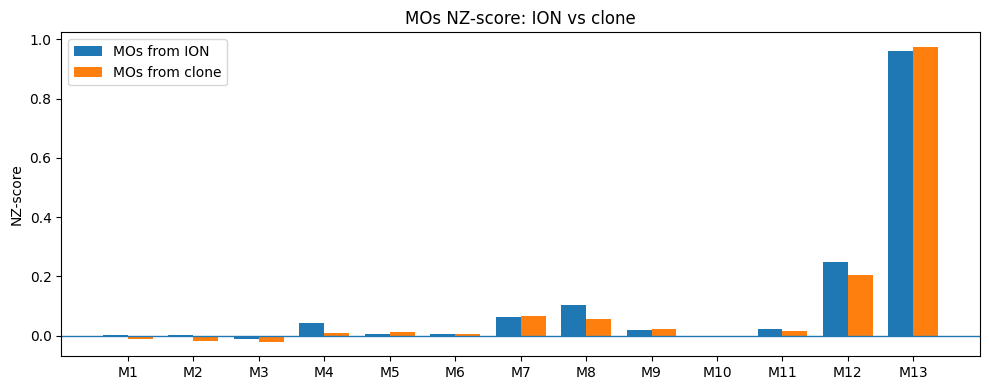

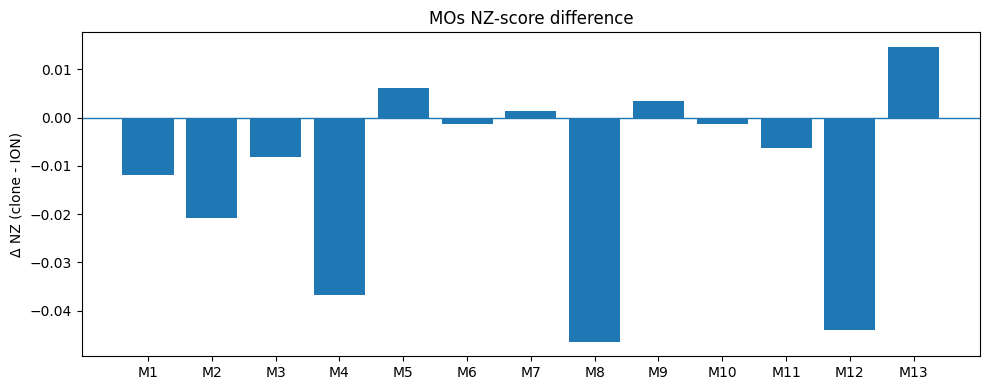

MOs: clone - ION diff = [-0.01198329 -0.02086457 -0.00809579 -0.03667374  0.00613426 -0.00133458
  0.00133557 -0.04642222  0.00350577 -0.00128738 -0.00620421 -0.04403964
  0.01463879]
L2(diff) = 0.07994920323994266
cosine similarity = 0.9968040623057912
Pearson corr = 0.9974605587761769


In [24]:
import numpy as np
import matplotlib.pyplot as plt

# ===== 1) 先得到 MOs clone 的 NZ_ER =====
def is_mos(x):
    if x is None: return False
    s = str(x)
    return s == "MOs" or s.startswith("MOs")

df_mos = df[df[region_col].apply(is_mos)].copy()
mos_id_set = set(df_mos[neuron_id_col].astype(str).tolist())

mos_indices = [i for i, nid in enumerate(names) if str(nid) in mos_id_set]
print("MOs 匹配到的节点数:", len(mos_indices))
if len(mos_indices) < 3:
    raise ValueError("MOs 节点不足 3 个，无法计算 triad motifs")

A_mos = sc[np.ix_(mos_indices, mos_indices)]
res_mos = analyze_motif_for_submatrix(A_mos, n_rand=2000, threshold=0.0, seed=42, device="cpu")
if res_mos is None:
    raise ValueError("MOs 总网络没有边或不满足 triad 计算条件")

nz_mos_clone = np.asarray(res_mos["table"]["NZ_ER"].values, float).ravel()
if nz_mos_clone.shape[0] == 14: nz_mos_clone = nz_mos_clone[1:]
assert nz_mos_clone.shape[0] == 13

# ===== 2) 得到 MOs ION 的 NZ =====
nz_mos_ion = np.asarray(d["results"][5]["MOs"]["motif_results"]["0"]["NZ"], float).ravel()
if nz_mos_ion.shape[0] == 14: nz_mos_ion = nz_mos_ion[1:]
assert nz_mos_ion.shape[0] == 13

# ===== 3) 对比可视化：ION vs clone（同一个脑区 MOs）=====
x = np.arange(13)
w = 0.38

plt.figure(figsize=(10, 4))
plt.bar(x - w/2, nz_mos_ion,   width=w, label="MOs from ION")
plt.bar(x + w/2, nz_mos_clone, width=w, label="MOs from clone")
plt.axhline(0, linewidth=1)
plt.xticks(x, [f"M{i}" for i in range(1, 14)], rotation=0)
plt.ylabel("NZ-score")
plt.title("MOs NZ-score: ION vs clone")
plt.legend()
plt.tight_layout()
plt.show()

# ===== 4) 差异图：clone - ION =====
diff = nz_mos_clone - nz_mos_ion
plt.figure(figsize=(10, 4))
plt.bar(x, diff)
plt.axhline(0, linewidth=1)
plt.xticks(x, [f"M{i}" for i in range(1, 14)], rotation=0)
plt.ylabel("Δ NZ (clone - ION)")
plt.title("MOs NZ-score difference")
plt.tight_layout()
plt.show()

# ===== 5) 数值差异（整体指标）=====
l2 = float(np.linalg.norm(diff))
cos = float(np.dot(nz_mos_clone, nz_mos_ion) / (np.linalg.norm(nz_mos_clone) * np.linalg.norm(nz_mos_ion) + 1e-12))
corr = float(np.corrcoef(nz_mos_clone, nz_mos_ion)[0, 1])

print("MOs: clone - ION diff =", diff)
print("L2(diff) =", l2)
print("cosine similarity =", cos)
print("Pearson corr =", corr)

In [32]:
# 你要看的那个 clone 的名字
clone_id = "ACA-081201-1"   # TODO: 换成你实际的 clone 名字

# 假设 CSV 里有 'clone' 和 'name' 两列
# 取出这个 clone 下所有的 neuron name
clone_mask = (df["clone"] == clone_id)
clone_neuron_ids = df.loc[clone_mask, "name"].astype(str).tolist()
print("该 clone 在 CSV 中的神经元（按 CSV 顺序）:", clone_neuron_ids)

# 把这些 neuron name 映射到 sc / names 中的 index
idxs = []
for i, nid in enumerate(names):
    if str(nid) in clone_neuron_ids:
        idxs.append(i)

print("在矩阵中的索引:", idxs)
print("节点数:", len(idxs))

# 如果节点少于 2 个，直接没法画
if len(idxs) < 2:
    raise ValueError("这个 clone 对应的神经元太少（<2），没法画图。")

# 取子矩阵 & 对应的名字
A_sub = sc[np.ix_(idxs, idxs)]
node_ids = [names[i] for i in idxs]

print("子图邻接矩阵形状:", A_sub.shape)
print("子图节点名字:", node_ids)

# 为了快速查表，把 df 按 'name' 设成索引
meta_by_name = df.set_index("name")   # 如果你的列名不是 name，就改成对应列

layers = []
for nid in node_ids:
    nid_str = str(nid)
    if nid_str in meta_by_name.index:
        layer_val = meta_by_name.loc[nid_str, "Layer"]  # 如果列名不是 Layer，这里改
    else:
        layer_val = "Unknown"
    layers.append(layer_val)

print("每个节点的 layer 信息:", list(zip(node_ids, layers)))

# 按出现顺序来一个 layer 列表（也可以自己手动指定顺序）
layer_order = []
for L in layers:
    if L not in layer_order:
        layer_order.append(L)

print("图中 layer 顺序:", layer_order)

# 给每个 layer 一个 y 坐标（0, 1, 2, ...）
layer_to_y = {L: i for i, L in enumerate(layer_order)}
print("layer -> y:", layer_to_y)

该 clone 在 CSV 中的神经元（按 CSV 顺序）: ['081201-ACA-1-09-07', '081201-ACA-1-09-06', '081201-ACA-1-09-08', '081201-ACA-1-09-03', '081201-ACA-1-09-09', '081201-ACA-1-09-04', '081201-ACA-1-09-05']
在矩阵中的索引: [24, 25, 26, 27, 28, 29, 30]
节点数: 7
子图邻接矩阵形状: (7, 7)
子图节点名字: ['081201-ACA-1-09-07', '081201-ACA-1-09-06', '081201-ACA-1-09-08', '081201-ACA-1-09-03', '081201-ACA-1-09-09', '081201-ACA-1-09-04', '081201-ACA-1-09-05']
每个节点的 layer 信息: [('081201-ACA-1-09-07', '2_3'), ('081201-ACA-1-09-06', '2_3'), ('081201-ACA-1-09-08', '2_3'), ('081201-ACA-1-09-03', '5'), ('081201-ACA-1-09-09', '2_3'), ('081201-ACA-1-09-04', '5'), ('081201-ACA-1-09-05', '5')]
图中 layer 顺序: ['2_3', '5']
layer -> y: {'2_3': 0, '5': 1}


边数: 26


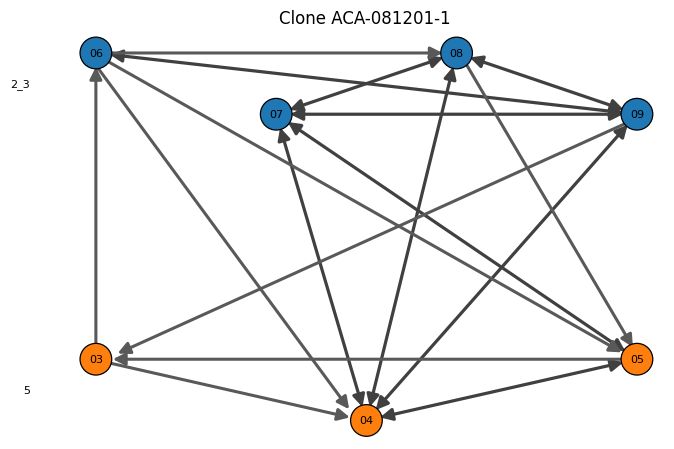

In [34]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict
import matplotlib.patches as mpatches

# ============================================================
# 你需要提前有：
# A_sub, node_ids, layers, clone_id
# 可选：layer_order
# ============================================================

A_sub = np.asarray(A_sub)
n = A_sub.shape[0]
assert A_sub.shape[0] == A_sub.shape[1]
assert len(node_ids) == n
assert len(layers) == n

# ---------- layer 顺序 ----------
try:
    layer_order
except NameError:
    layer_order = sorted(list(dict.fromkeys(layers)))

# ---------- layer -> y baseline ----------
layer_gap = 1.0
layer_to_y = {L: i * layer_gap for i, L in enumerate(layer_order)}

# ============================================================
# 1) 建图
# ============================================================
G = nx.DiGraph()
for nid, L in zip(node_ids, layers):
    G.add_node(nid, layer=L)

threshold = 0.0
for i in range(n):
    for j in range(n):
        if i == j:
            continue
        if A_sub[i, j] > threshold:
            G.add_edge(node_ids[i], node_ids[j])

print("边数:", G.number_of_edges())

# ============================================================
# 2) 布局：同层“一个下去，一个上去”交错
#    - x 均匀铺开
#    - y = baseline ± amp 交替
# ============================================================
layer_to_nodes = {}
for nid, L in zip(node_ids, layers):
    layer_to_nodes.setdefault(L, []).append(nid)

amp = 0.10  # 同层上下偏移幅度（可微调 0.06~0.14）

pos = {}
for L in layer_order:
    nodes_L = layer_to_nodes.get(L, [])
    if not nodes_L:
        continue

    # 稳定顺序
    nodes_L = sorted(nodes_L, key=lambda x: str(x))

    # x 均匀铺开
    if len(nodes_L) == 1:
        xs = [0.5]
        offsets = [0.0]
    else:
        xs = np.linspace(0.05, 0.95, len(nodes_L))
        # 交错：0->下,1->上,2->下...
        offsets = [(-amp if (i % 2 == 0) else amp) for i in range(len(nodes_L))]

    y_base = layer_to_y[L]

    for x, dy, nid in zip(xs, offsets, nodes_L):
        pos[nid] = (x, -(y_base + dy))  # y 取负：上层在上

# ============================================================
# 3) 颜色：按 layer
# ============================================================
base_colors = [
    "#1f77b4", "#ff7f0e", "#2ca02c",
    "#d62728", "#9467bd", "#8c564b",
    "#e377c2", "#7f7f7f", "#bcbd22"
]
layer_to_color = {L: base_colors[i % len(base_colors)] for i, L in enumerate(layer_order)}

# ============================================================
# 4) 画图
# ============================================================
fig = plt.figure(figsize=(6.8, 4.6))
ax = plt.gca()
ax.set_axis_off()

# ============================================================
# 4A) 双向边合并 + 直线粗箭头
# ============================================================
pair_edges = defaultdict(set)
for u, v in G.edges():
    pair_edges[frozenset((u, v))].add((u, v))

edge_x_jitter = 0.010  # 同一对层之间单向边轻微水平抖动
directed_groups = defaultdict(list)
bidirectional_pairs = []

for key, dir_set in pair_edges.items():
    uv = list(key)
    if len(uv) != 2:
        continue
    u, v = uv[0], uv[1]

    has_uv = (u, v) in dir_set
    has_vu = (v, u) in dir_set

    if has_uv and has_vu:
        bidirectional_pairs.append((u, v))
    else:
        (a, b) = list(dir_set)[0]
        La = G.nodes[a].get("layer")
        Lb = G.nodes[b].get("layer")
        directed_groups[(La, Lb)].append((a, b))

# ---- 双向边：一条双向直线 ----
for u, v in sorted(bidirectional_pairs, key=lambda x: (str(x[0]), str(x[1]))):
    x0, y0 = pos[u]
    x1, y1 = pos[v]

    arrow = mpatches.FancyArrowPatch(
        (x0, y0), (x1, y1),
        arrowstyle="<|-|>",
        mutation_scale=18,
        linewidth=2.3,
        color="0.25",
        shrinkA=10, shrinkB=10
    )
    ax.add_patch(arrow)

# ---- 单向边：按层对做极轻微水平抖动（仍是直线）----
for (La, Lb), edgelist in directed_groups.items():
    k = len(edgelist)
    if k == 0:
        continue

    edgelist = sorted(edgelist, key=lambda x: (str(x[0]), str(x[1])))

    if k == 1:
        offsets = [0.0]
    else:
        idx = np.arange(k) - (k - 1) / 2
        offsets = idx * edge_x_jitter

    for (u, v), dx in zip(edgelist, offsets):
        x0, y0 = pos[u]
        x1, y1 = pos[v]

        x0o = x0 + dx
        x1o = x1 + dx

        arrow = mpatches.FancyArrowPatch(
            (x0o, y0), (x1o, y1),
            arrowstyle='-|>',
            mutation_scale=18,
            linewidth=2.2,
            color="0.35",
            shrinkA=10, shrinkB=10
        )
        ax.add_patch(arrow)

# ============================================================
# 4B) 画节点
# ============================================================
node_list = list(G.nodes())
node_layer_list = [G.nodes[nid].get("layer") for nid in node_list]
node_colors = [layer_to_color.get(L, "#7f7f7f") for L in node_layer_list]

nx.draw_networkx_nodes(
    G, pos,
    nodelist=node_list,
    node_color=node_colors,
    node_size=520,
    edgecolors="black",
    linewidths=0.9,
    ax=ax
)

# ============================================================
# 4C) 标签：只取最后两个字符
# ============================================================
def last2(x):
    s = str(x)
    return s[-2:] if len(s) >= 2 else s

labels_dict = {nid: last2(nid) for nid in node_ids}

nx.draw_networkx_labels(
    G, pos,
    labels=labels_dict,
    font_size=8,
    ax=ax
)

# ============================================================
# 4D) 左侧标层
# ============================================================
x_text = -0.06
for L in layer_order:
    if L not in layer_to_y:
        continue
    y = layer_to_y[L]
    ax.text(x_text, -y, str(L), ha="right", va="center", fontsize=8)

plt.title(f"Clone {clone_id}")
plt.tight_layout()
plt.show()

MOp: clones = 41 | LCC<6: 6


MOs: clones = 33 | LCC<6: 4


PFC: clones = 18 | LCC<6: 4


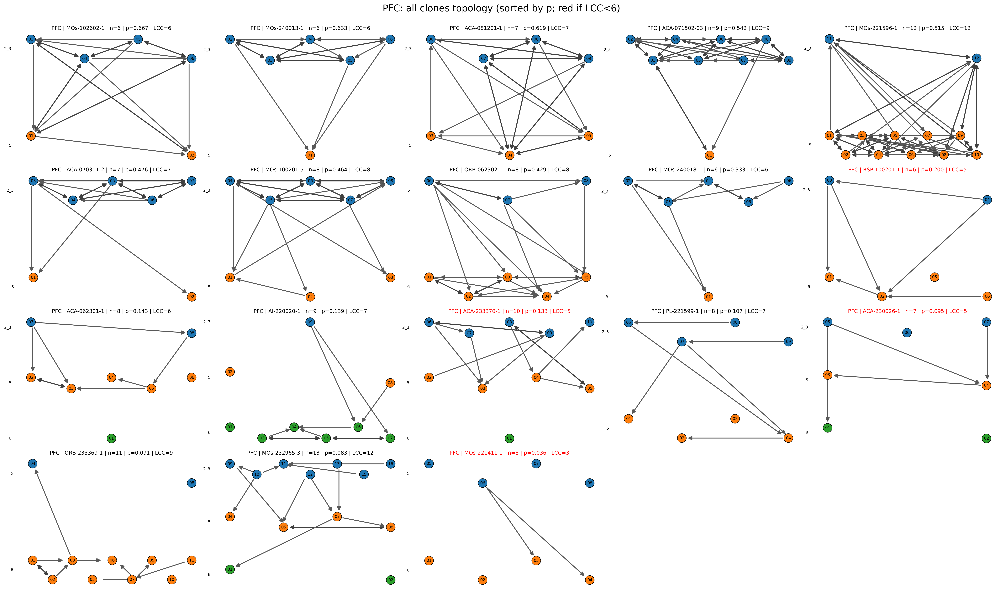

✅ Done. 已保存：MOp_all_clones_topology.png / MOs_all_clones_topology.png / PFC_all_clones_topology.png


In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import networkx as nx

# 连接矩阵
sc = np.load("wb_alltype_sc_subset_zj_1_2.5_42_1209.npy")

# 节点名字（和 sc 顺序一一对应）
names = np.load("wb_alltype_sc_subset_names_zj_1_2.5_42_1209.npy", allow_pickle=True)
names = names.tolist()   # 确保是 list[str]

# CSV 信息
df = pd.read_csv("Metadata_PFC_MOp.csv")
# ============================================================
# ===== 0. 前提：你已有 sc / names / df（否则请先读入） =====
# ============================================================
# sc:   N×N 邻接/权重矩阵（numpy）
# names: 长度 N 的 neuron id 列表
# df:   包含至少 ['clone','Layer','Clone_region','name'(或 Unnamed: 0)] 的 DataFrame

# ============================================================
# ===== 1. 列名自动识别 + 基础映射（加速索引） =====
# ============================================================
neuron_id_col = "name"

clone_region_col = None
for cand in ["Clone_region", "clone_region", "CLONE_REGION"]:
    if cand in df.columns:
        clone_region_col = cand
        break

names = [str(x) for x in names]
name_to_idx = {nid: i for i, nid in enumerate(names)}

meta_by_name = df.copy()
meta_by_name[neuron_id_col] = meta_by_name[neuron_id_col].astype(str)
meta_by_name = meta_by_name.set_index(neuron_id_col)

# ============================================================
# ===== 2. 3 大脑区定义 + clone->group（clone 内投票多数） =====
# ============================================================
def group3(r):
    r = str(r)
    if r.startswith("MOp"): return "MOp"
    if r.startswith("MOs"): return "MOs"
    return "PFC"

df2 = df.copy()
df2[neuron_id_col] = df2[neuron_id_col].astype(str)
df2[clone_region_col] = df2[clone_region_col].astype(str)
df2["group3"] = df2[clone_region_col].map(group3)

clone_to_group = (df2.groupby("clone")["group3"].agg(lambda x: x.value_counts().index[0]).to_dict())

# ============================================================
# ===== 3. 画单个 clone 子图（说明：外部控制标题颜色，不在内部 set_title）=====
# ============================================================
def draw_clone_on_ax(ax, A_sub, node_ids, layers, edge_thr=0.0, amp=0.10, layer_gap=1.0, edge_x_jitter=0.010):

    A_sub = np.asarray(A_sub, float)
    n = A_sub.shape[0]
    ax.set_axis_off()
    if n < 2:
        return

    canonical = ["1", "2_3", "4", "5", "6"]
    present = [str(x) for x in layers]
    layer_order = [L for L in canonical if L in present]
    for L in present:
        if L not in layer_order:
            layer_order.append(L)

    layer_to_nodes = {}
    for nid, L in zip(node_ids, present):
        layer_to_nodes.setdefault(L, []).append(nid)

    layer_to_y = {L: i * layer_gap for i, L in enumerate(layer_order)}

    pos = {}
    for L in layer_order:
        nodes_L = layer_to_nodes.get(L, [])
        if not nodes_L:
            continue
        nodes_L = sorted(nodes_L, key=lambda x: str(x))
        if len(nodes_L) == 1:
            xs, offsets = [0.5], [0.0]
        else:
            xs, offsets = np.linspace(0.05, 0.95, len(nodes_L)), [(-amp if (i % 2 == 0) else amp) for i in range(len(nodes_L))]
        y_base = layer_to_y[L]
        for x, dy, nid in zip(xs, offsets, nodes_L):
            pos[nid] = (x, -(y_base + dy))

    B = (A_sub > edge_thr).astype(np.uint8)
    np.fill_diagonal(B, 0)

    bidir, unidir = [], []
    for i in range(n):
        for j in range(i + 1, n):
            if B[i, j] and B[j, i]:
                bidir.append((i, j))
            elif B[i, j] and (not B[j, i]):
                unidir.append((i, j))
            elif B[j, i] and (not B[i, j]):
                unidir.append((j, i))

    directed_groups = {}
    for i, j in unidir:
        La, Lb = str(layers[i]), str(layers[j])
        directed_groups.setdefault((La, Lb), []).append((i, j))

    for i, j in bidir:
        u, v = node_ids[i], node_ids[j]
        if u not in pos or v not in pos:
            continue
        x0, y0 = pos[u]
        x1, y1 = pos[v]
        ax.add_patch(mpatches.FancyArrowPatch((x0, y0), (x1, y1), arrowstyle="<|-|>", mutation_scale=14, linewidth=1.8, color="0.25", shrinkA=10, shrinkB=10))

    for (La, Lb), edgelist in directed_groups.items():
        edgelist = sorted(edgelist, key=lambda t: (t[0], t[1]))
        k = len(edgelist)
        offsets = [0.0] if k == 1 else (np.arange(k) - (k - 1) / 2) * edge_x_jitter
        for (i, j), dx in zip(edgelist, offsets):
            u, v = node_ids[i], node_ids[j]
            if u not in pos or v not in pos:
                continue
            x0, y0 = pos[u]
            x1, y1 = pos[v]
            ax.add_patch(mpatches.FancyArrowPatch((x0 + dx, y0), (x1 + dx, y1), arrowstyle='-|>', mutation_scale=14, linewidth=1.6, color="0.35", shrinkA=10, shrinkB=10))

    base_colors = ["#1f77b4","#ff7f0e","#2ca02c","#d62728","#9467bd","#8c564b","#e377c2","#7f7f7f","#bcbd22"]
    layer_to_color = {L: base_colors[i % len(base_colors)] for i, L in enumerate(layer_order)}
    node_colors = [layer_to_color.get(str(L), "#7f7f7f") for L in present]

    xs = [pos[nid][0] for nid in node_ids if nid in pos]
    ys = [pos[nid][1] for nid in node_ids if nid in pos]
    cols = [node_colors[i] for i, nid in enumerate(node_ids) if nid in pos]
    ax.scatter(xs, ys, s=240, c=cols, edgecolors="black", linewidths=0.7, zorder=3)

    if n <= 18:
        for nid in node_ids:
            if nid in pos:
                s = str(nid)
                lab = s[-2:] if len(s) >= 2 else s
                ax.text(pos[nid][0], pos[nid][1], lab, ha="center", va="center", fontsize=7, zorder=4)

    x_text = -0.06
    for L in layer_order:
        ax.text(x_text, -layer_to_y[L], str(L), ha="right", va="center", fontsize=7)

# ============================================================
# ===== 4. 每个大脑区画一张“大图”：clone 按 p 排序；LCC<6 标红 =====
# ============================================================
edge_thr = 0.0
groups = ["MOp", "MOs", "PFC"]

for g in groups:
    clones_g = [cl for cl, gg in clone_to_group.items() if gg == g]

    clones_keep, clone_to_nodes, clone_to_layers, clone_to_Asub = [], {}, {}, {}
    clone_to_p, clone_to_lcc = {}, {}

    for cl in clones_g:
        sub = df2[df2["clone"] == cl]
        node_ids = sub[neuron_id_col].astype(str).tolist()

        idxs = [name_to_idx[nid] for nid in node_ids if nid in name_to_idx]
        idxs = sorted(set(idxs))
        if len(idxs) < 2:
            continue

        node_ids2 = [names[i] for i in idxs]
        layers2 = [str(meta_by_name.loc[nid, "Layer"]) if nid in meta_by_name.index else "Unknown" for nid in node_ids2]
        A_sub = sc[np.ix_(idxs, idxs)]

        B = (A_sub > edge_thr)
        np.fill_diagonal(B, False)
        n = B.shape[0]
        e = int(B.sum())
        p = e / (n * (n - 1)) if n > 1 else 0.0

        U = B | B.T
        visited = np.zeros(n, dtype=bool)
        best = 0
        for s in range(n):
            if visited[s]:
                continue
            stack = [s]
            visited[s] = True
            cnt = 0
            while stack:
                v = stack.pop()
                cnt += 1
                for u in np.flatnonzero(U[v]):
                    if not visited[u]:
                        visited[u] = True
                        stack.append(u)
            if cnt > best:
                best = cnt

        clones_keep.append(cl)
        clone_to_nodes[cl] = node_ids2
        clone_to_layers[cl] = layers2
        clone_to_Asub[cl] = A_sub
        clone_to_p[cl] = p
        clone_to_lcc[cl] = best

    clones_keep = sorted(clones_keep, key=lambda cl: (-clone_to_p.get(cl, -1.0), str(cl)))

    nC = len(clones_keep)
    print(f"{g}: clones = {nC} | LCC<6: {sum(clone_to_lcc[cl] < 6 for cl in clones_keep)}")
    if nC == 0:
        continue

    ncols = int(np.ceil(np.sqrt(nC)))
    nrows = int(np.ceil(nC / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4.8, nrows * 3.6))
    axes = np.atleast_1d(axes).ravel()
    for ax in axes[nC:]:
        ax.set_axis_off()

    for k, cl in enumerate(clones_keep):
        ax = axes[k]
        A_sub = clone_to_Asub[cl]
        node_ids2 = clone_to_nodes[cl]
        layers2 = clone_to_layers[cl]
        p = clone_to_p[cl]
        lcc = clone_to_lcc[cl]

        draw_clone_on_ax(ax, A_sub, node_ids2, layers2, edge_thr=edge_thr)

        tcolor = "red" if lcc < 6 else "black"
        ax.set_title(f"{g} | {cl} | n={len(node_ids2)} | p={p:.3f} | LCC={lcc}", fontsize=9, color=tcolor)

    fig.suptitle(f"{g}: all clones topology (sorted by p; red if LCC<6)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    fig.savefig(f"{g}_all_clones_topology.png", dpi=300)
    plt.show()

print("✅ Done. 已保存：MOp_all_clones_topology.png / MOs_all_clones_topology.png / PFC_all_clones_topology.png")